<a href="#"><img align="left" alt="Python" src="https://img.shields.io/badge/Python-013243.svg?logo=python&logoColor=white"></a>
<a href="#"><img align="left" alt="Pandas" src="https://img.shields.io/badge/Pandas-150458.svg?logo=pandas&logoColor=white"></a>
<a href="#"><img align="left" alt="NumPy" src="https://img.shields.io/badge/Numpy-2a4d69.svg?logo=numpy&logoColor=white"></a>
<a href="#"><img align="left" alt="Matplotlib" src="https://img.shields.io/badge/Matplotlib-8DF9C1.svg?logo=matplotlib&logoColor=white"></a>
<a href="#"><img align="left" alt="seaborn" src="https://img.shields.io/badge/seaborn-65A9A8.svg?logo=pandas&logoColor=white"></a>
<a href="#"><img align="left" alt="plotly" src="https://img.shields.io/badge/plotly-adcbe3.svg?logo=plotly&logoColor=white"></a>
<a href="#"><img align="left" alt="sklearn" src="https://img.shields.io/badge/sklearn-4b86b4.svg?logo=scikitlearn&logoColor=white"></a>
<a href="#"><img align="left" alt="SciPy" src="https://img.shields.io/badge/SciPy-1560bd.svg?logo=scipy&logoColor=white"></a>

In [1]:
from imports import *
%matplotlib inline

In [16]:
# Display format
pd.options.display.float_format = '{:,.2f}'.format

In [2]:
# Data acquisition

df = acquire.get_zillow_data()

In [3]:
# Data Preparation

df = prepare.prep_zillow(df)

In [5]:
# Splitting data into train, validate, test

train,validate,test = prepare.split(df)

In [ ]:
# pairplot function

def plot_variable_pairs(df):
    return sns.pairplot(df, corner = True, kind='reg', plot_kws={'line_kws':{'color':'red'}, 'scatter_kws':{'s': 1, 'alpha': 0.5}})

In [ ]:
# plot_variable_pairs(train)

# Exploration

## Question 1. What associated with `assessed_value` the most?

In [6]:
continuous_cols = ['square_feet', 'lot_size', 'age', 'assessed_value']

In [7]:
train_corr = train[continuous_cols].corr()
train_corr

,square_feet,lot_size,age,assessed_value
square_feet,1.000000,0.306026,-0.479969,0.579993
lot_size,0.306026,1.000000,-0.104824,0.146665
age,-0.479969,-0.104824,1.000000,-0.223995
assessed_value,0.579993,0.146665,-0.223995,1.000000


<AxesSubplot:>

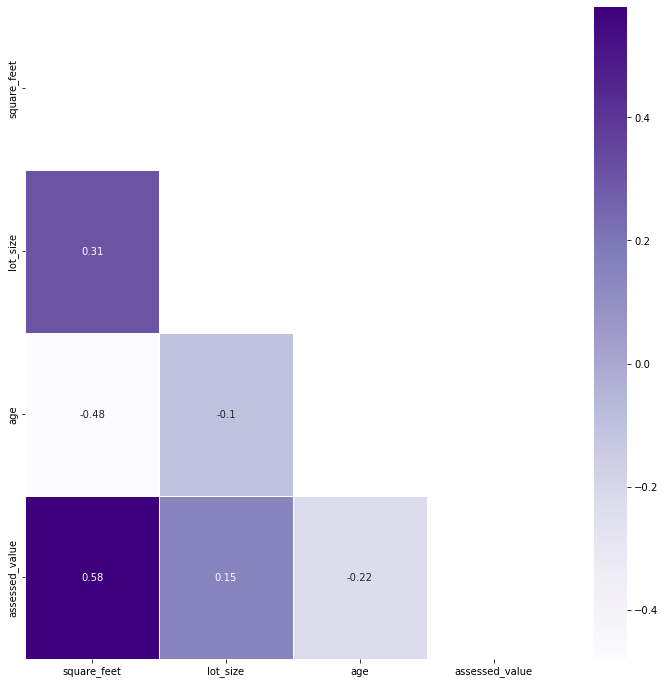

In [8]:
plt.figure(figsize = (12,12))
sns.heatmap(train_corr,cmap='Purples', annot=True, linewidth=0.5, mask= np.triu(train_corr))

## Answer 1:
**square_feet** has strong positive (0.58) correlation with **assessed_value**

Text(0.5, 1.0, 'Assessed Value by Square Feet')

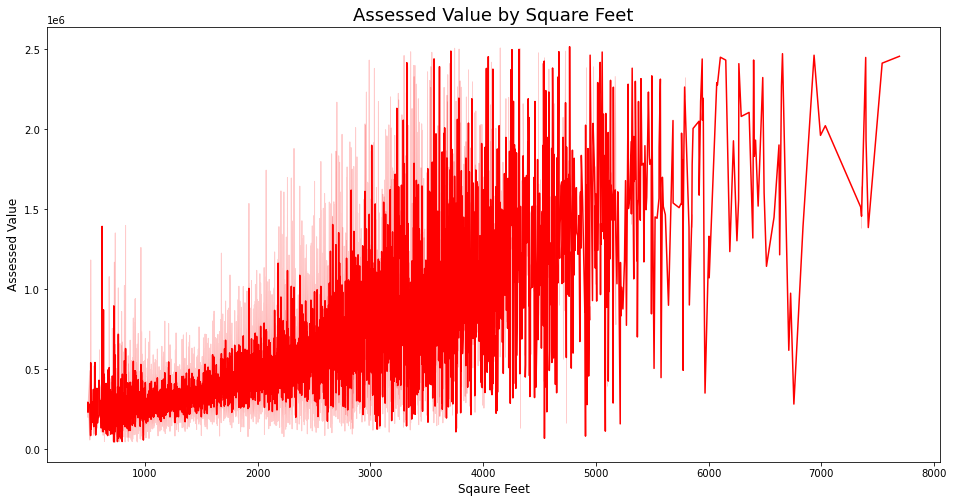

In [10]:
plt.figure(figsize = (16,8))
sns.lineplot(x = train.square_feet, y = train.assessed_value, color = 'red', data = train)
plt.xlabel('Sqaure Feet', fontsize = 12)
plt.ylabel('Assessed Value', fontsize = 12)
plt.title('Assessed Value by Square Feet', fontsize = 18)

***

## Question 2. Is `assessed_value` significantly different across 3 different counties?

In [17]:
train.groupby('county').assessed_value.mean()

county
Los Angeles   431,371.49
Orange        544,886.75
Ventura       488,414.72
Name: assessed_value, dtype: float64

Text(0, 0.5, 'Assessed Value')

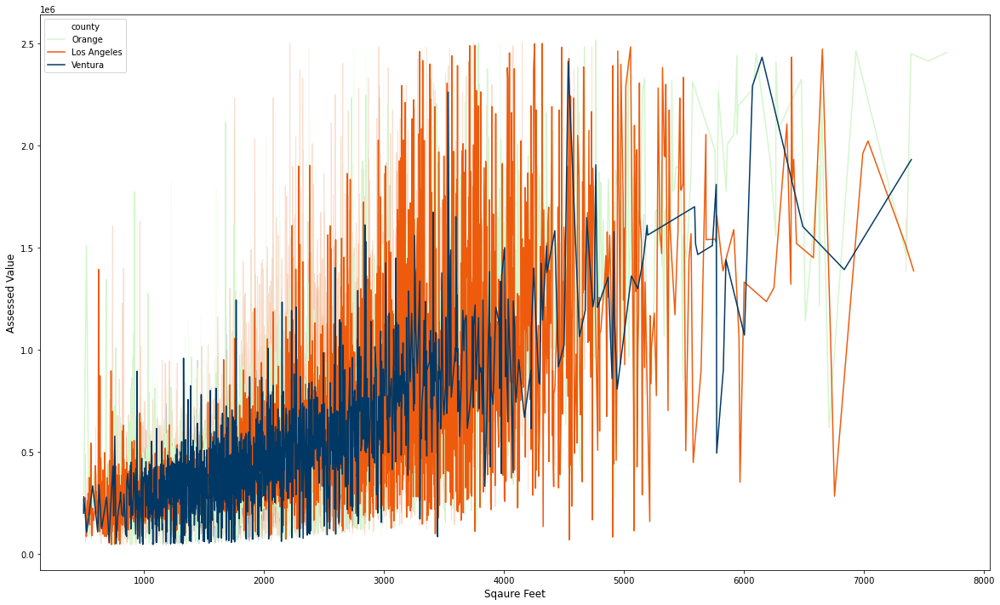

In [12]:
plt.figure(figsize = (20,12))
colors = ['#D4F6CC', '#EF5B0C', '#003865']
sns.lineplot(x = train.square_feet, y = train.assessed_value, palette = colors, data = train, hue = 'county')
plt.xlabel('Sqaure Feet', fontsize = 12)
plt.ylabel('Assessed Value', fontsize = 12)

In [14]:
fig = px.box(train, x="county", y="assessed_value", points="all", color = 'county', color_discrete_sequence=["red", "green", "blue"])
fig.show()

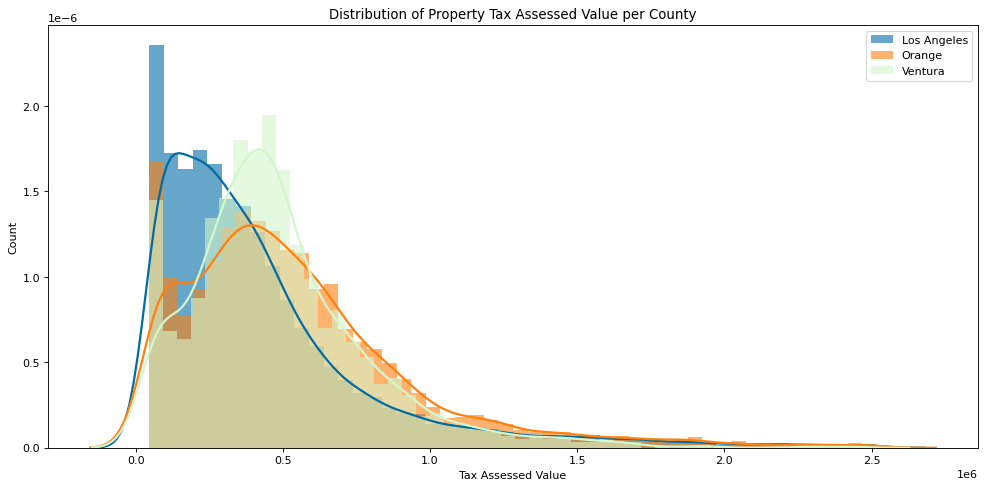

In [18]:
# Visualizing distribution of assessed_value per county

losangeles = train[train['county'] == 'Los Angeles'].assessed_value
orange = train[train['county'] == 'Orange'].assessed_value
ventura = train[train['county'] == 'Ventura'].assessed_value

kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
plt.figure(figsize=(15,7), dpi= 80)
sns.distplot(losangeles, color="#006ba4", label="Los Angeles", **kwargs)
sns.distplot(orange, color="#ff800e", label="Orange", **kwargs)
sns.distplot(ventura, color="#D4F6CC", label="Ventura", **kwargs)
plt.xlabel('Tax Assessed Value')
plt.ylabel('Count')
plt.title('Distribution of Property Tax Assessed Value per County')
plt.legend();

In [ ]:
# Visualizing location
# fig = px.choropleth(train, locations=["CA"], locationmode="USA-states", color=[1], scope="usa")
 
# fig.show()

### ANOVA Test
**Set Hypothesis**

$H_{0}$: Mean of property tax assessed value of Los Angeles, Orange, and Ventura County are all equal.

$H_{a}$: Mean of property tax assessed value of Los Angeles, Orange, and Ventura County are not all equal.

**Set Alpha**

In [27]:
alpha = 0.05

**Verify Assumptions**

- Normal: Yes
- Independent: Yes
- Variance: False

**Decide**

In [31]:
t, p = stats.f_oneway(losangeles, orange, ventura)
if p < alpha:
    print("We reject H0. \nMean of property tax assessed value of Los Angeles, Orange, and Ventura County are not all equal. ")
else:
    print("We fail to reject H0")

We reject H0. 
Mean of property tax assessed value of Los Angeles, Orange, and Ventura County are not all equal. 


## Answer 2:
**Orange county** has the highest tax assessed value on average

**Los Angeles county** has the loweset property tax assessed value on average

***

## Question 3. Is having pool or not associated with `assessed value`?

In [45]:
fig = px.box(train, x="has_pool", y="assessed_value", points="all", color = 'has_pool', color_discrete_sequence=['#ff800e','#006ba4'])
fig.show()

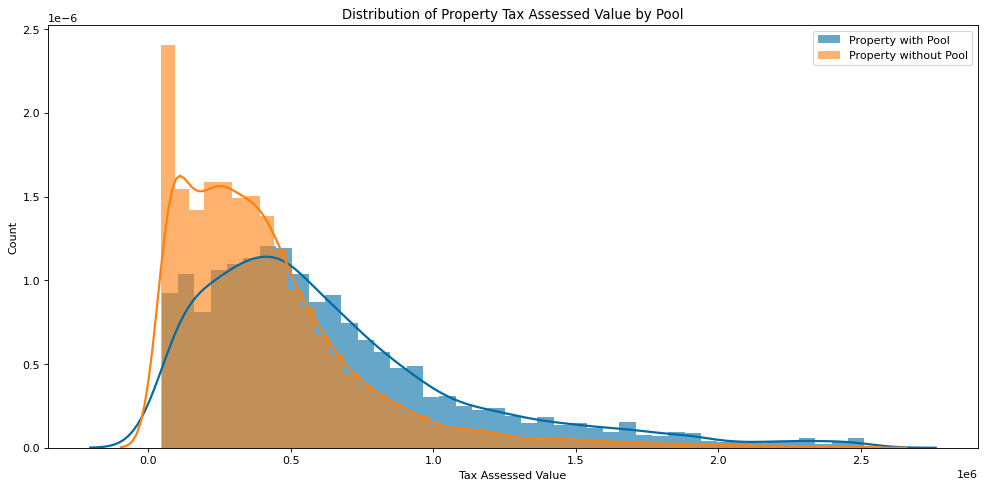

In [26]:
# Visualizing distribution of assessed_value for has_pool or not

pool = train[train['has_pool'] == 1].assessed_value
no_pool = train[train['has_pool'] == 0].assessed_value

kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
plt.figure(figsize=(15,7), dpi= 80)
sns.distplot(pool, color="#006ba4", label="Property with Pool", **kwargs)
sns.distplot(no_pool, color="#ff800e", label="Property without Pool", **kwargs)

plt.xlabel('Tax Assessed Value')
plt.ylabel('Count')
plt.title('Distribution of Property Tax Assessed Value by Pool')
plt.legend();

### Independent T-Test
**Set Hypothesis**

$H_{0}$: Mean of property tax assessed value of property with pool <= Mean of property tax assessed value of property without pool.

$H_{a}$: Mean of property tax assessed value of property with pool > Mean of property tax assessed value of property without pool.

**Set Alpha**

In [ ]:
alpha = 0.05

**Verify Assumptions**

- Normal: Yes
- Independent: Yes
- Variance: False

**Decide**

In [30]:
t, p = stats.ttest_ind(pool, no_pool, equal_var=False)
if p/2 < alpha:
    print("We reject H0. \nMean of property tax assessed value of property with pool > Mean of property tax assessed value of property without pool. ")
else:
    print("We fail to reject H0")

We reject H0. 
Mean of property tax assessed value of property with pool > Mean of property tax assessed value of property without pool. 


***

## Question 4. Is number of bedrooms and bathrooms associated with `assessed value`?

**Bedrooms**

In [40]:
fig = px.box(train, x="bedrooms_size", y="assessed_value", points="all", color = 'bedrooms_size')
fig.update_xaxes(categoryorder = 'category descending')
fig.show()

<AxesSubplot:xlabel='bedrooms', ylabel='assessed_value'>

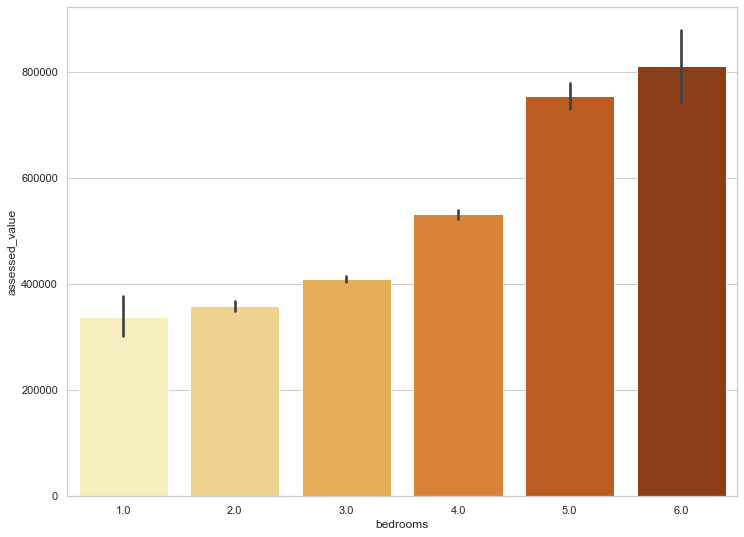

In [62]:
plt.figure(figsize = (12,9))
sns.set_theme(style="whitegrid")
sns.barplot(x="bedrooms", y="assessed_value", data=train, palette="YlOrBr")

### ANOVA Test
**Set Hypothesis**

$H_{0}$: Mean of property tax assessed value of small, medium, large bedrooms are all equal.

$H_{a}$: Mean of property tax assessed value of small, medium, large bedrooms are not all equal.

**Set Alpha**

In [46]:
alpha = 0.05

**Verify Assumptions**

- Normal: Yes
- Independent: Yes
- Variance: False

In [48]:
smallbed = train[train['bedrooms_size']=='small'].assessed_value
mediumbed = train[train['bedrooms_size']=='medium'].assessed_value
largebed = train[train['bedrooms_size']=='large'].assessed_value
t, p = stats.f_oneway(smallbed, mediumbed, largebed)
if p < alpha:
    print("We reject H0. \nMean of property tax assessed value of small, medium, large bedrooms are not all equal. ")
else:
    print("We fail to reject H0")

We reject H0. 
Mean of property tax assessed value of small, medium, large bedrooms are not all equal. 


**Bathrooms**

In [49]:
fig = px.box(train, x="bathrooms_size", y="assessed_value", points="all", color = 'bathrooms_size')
fig.update_xaxes(categoryorder = 'category descending')
fig.show()

<AxesSubplot:xlabel='bathrooms', ylabel='assessed_value'>

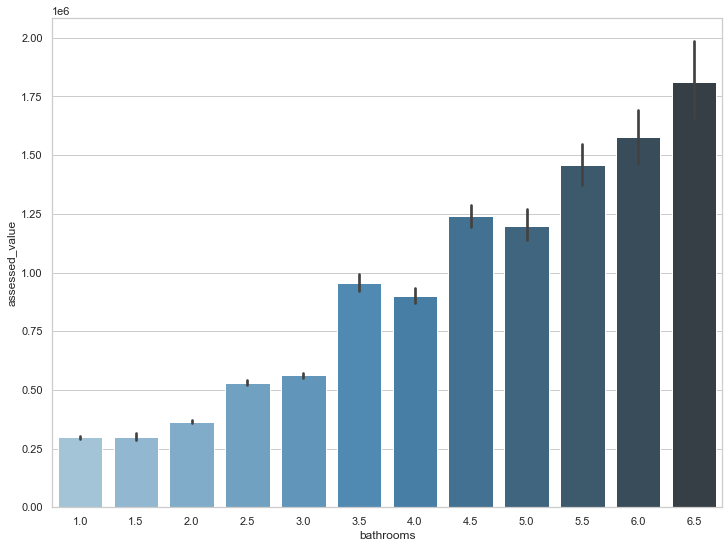

In [55]:
plt.figure(figsize = (12,9))
sns.set_theme(style="whitegrid")
sns.barplot(x="bathrooms", y="assessed_value", data=train, palette = 'Blues_d')


### ANOVA Test
**Set Hypothesis**

$H_{0}$: Mean of property tax assessed value of small, medium, large bathrooms are all equal.

$H_{a}$: Mean of property tax assessed value of small, medium, large bathrooms are not all equal.

**Set Alpha**

In [63]:
alpha = 0.05

**Verify Assumptions**

- Normal: Yes
- Independent: Yes
- Variance: False

In [65]:
smallbath = train[train['bathrooms_size']=='small'].assessed_value
mediumbath = train[train['bathrooms_size']=='medium'].assessed_value
largebath = train[train['bathrooms_size']=='large'].assessed_value
t, p = stats.f_oneway(smallbath, mediumbath, largebath)
if p < alpha:
    print("We reject H0. \nMean of property tax assessed value of small, medium, large bathrooms are not all equal. ")
else:
    print("We fail to reject H0")

We reject H0. 
Mean of property tax assessed value of small, medium, large bathrooms are not all equal. 


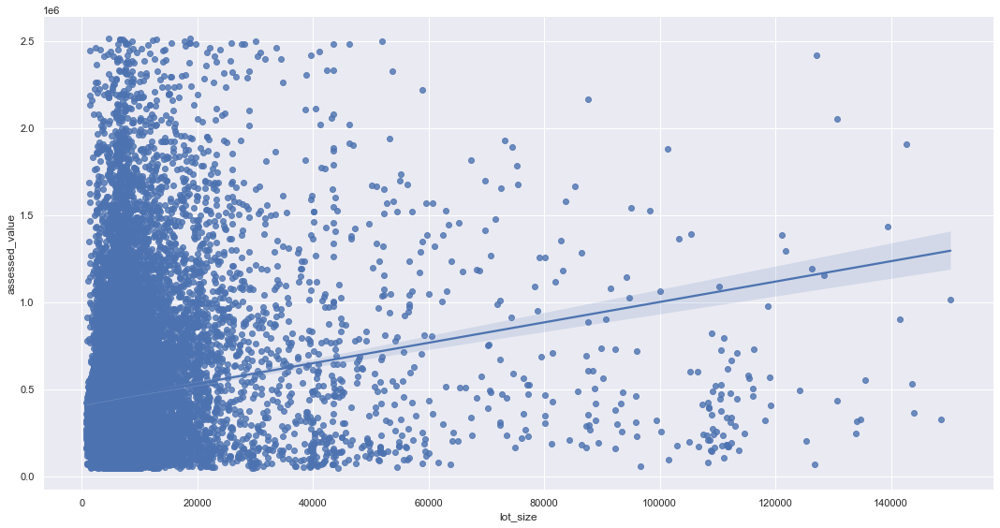

In [83]:
sns.lmplot(data = train, x='lot_size', y='assessed_value', palette = 'Set1', height=8, aspect=15/8)

## Key Takeaways:

***

# Modeling
**Evaluation Metric:** RMSE - Average distance of each point from fitted regression line

### Baseline Prediction

In [68]:
# Create a dataframe for predictions from all models including baseline
predictions = pd.DataFrame({
    'actual': train.assessed_value
}) 

In [70]:
# Set baseline prediction as the mean of assessed_value
predictions['baseline'] = train.assessed_value.mean()

In [74]:
# Calculating baseline root mean squared error
baseline_RMSE = mean_squared_error(predictions.actual, predictions.baseline, squared = False)
print('RMSE =', "{:.1f}".format(baseline_RMSE))

RMSE = 388607.0


### Scaling data

In [75]:
train.columns

Index(['longitude', 'latitude', 'bedrooms', 'bathrooms', 'square_feet',
       'lot_size', 'has_pool', 'fips_code', 'age', 'assessed_value',
       'tax_amount', 'county', 'bedrooms_size', 'bathrooms_size',
       'county_Los Angeles', 'county_Orange', 'county_Ventura',
       'bedrooms_size_small', 'bedrooms_size_medium', 'bedrooms_size_large',
       'bathrooms_size_small', 'bathrooms_size_medium',
       'bathrooms_size_large'],
      dtype='object')

In [ ]:
# Splitting data into X and y
cols = ['bedrooms', 'bathrooms', 'square_feet', 'lot_size', '']

## Summary

## Recommendations

## Next Steps